# One dimensional Kalman filter




## Introduction

This script is dealing with the simple problem for the data scientists but it is a real industry problem. The purpose of the script is to explain the Kalman filter and Linear regression on the basic level. 
First of all, raw data will be presented with a lot of noise coming from the sensors. Then, data preparation should be done, even before usage of the Kalman filter and it will be explained why. Kalman filter will be used for a one dimensional problem, but basic explanation and author's understanding of the algorithm will be presented. Linear regression for one dimensional problem is simple mean for previous measurements, but still, it a supervised learning solution and it is a good thing to get into ML on a basic level.

This is a Jupyter script (ex iPython), so it could be interactive. The code could be changed and tracked real time. Every cell could be changed, but if the code is changed, it should be runned if some of the variables are going to be used in the next cell. To run the cell click CTRL+Enter. Otherwise, click on the Run all in the Cell tab on the top of the page.



## Problem definision

The problem is to track adhesive consumption per bottle on the real indutrial facility. There are several thousents of bottles per minut in this facility and even a little change, like 0,01 g/bottle, could means great loss for the company. There are several sensors that tracks this facility, but for this script only two are meaningfull, bottle counter and adhesive weight.
So, there is an industrila line with bottles on it and in one point the adhesive is being set on each of them. Bottle counter is an sensor that goes from 0 - 10000. After it gets to 10000, the counter is set again on zero. This is the way the things are constructed. We are not dealing with the question is that the good way or not. Information coming from the bottle counter is without error. But the weight coming from the scale is full of noise.
Noise coming from the sensor is not only due to sensor error but the process it self. On the bucket with adhesive there is a vibrating motor witch pulls the glue out of the bucket. That causes a lot of noise. Plus, there are some errors coming from the human mistake, when the worker stand on the scale and similar. The bucket it self is around 30kg, so it needs to be changed periodically.

Lets start with the data, it will be much clearer.

## Importing raw data

First thing we need to do is to import raw data coming from the sensors. The data is processed for this script, but the actual algorithm is working with the real time data. Here, we are using some data that was puted in the JSON format.
The data are gathered on every 10 seconds. So, every 10 seconds is one frame. In each frame we get the current count on the bottle counter and the surrent weight from the scale.

In [219]:
import urllib.request
import urllib.parse
import json
import matplotlib.pyplot as plt
import numpy as np
import random
import pylab
import matplotlib.mlab as mlab
import math

Open the file and transform it to the json object in order to be easier to manipulate with the data.

In [220]:
data = open('data.txt', 'r')
json_string = data.read()
data.close()
json_data = json.loads(json_string)

Now, the raw data are in the memory, lets try to plot them in order to show how are they looking. First, we are going to fill the lists with those data.

In [221]:
rawWeights = []
rawBtlCntr = []
for j in json_data:
    if int(j['FrameType']) == 1:   #uzimamo samo vrednosti sa PLC-a
        #trenutne vrednosti koje dolaze sa PLC-a, odn. u ovom slučaju iz JSON-a
        curr_weight = int(j['LC1'])
        curr_btlcntr = int(j['BTLCNTR2'])
        rawWeights.append(curr_weight)
        rawBtlCntr.append(curr_btlcntr)

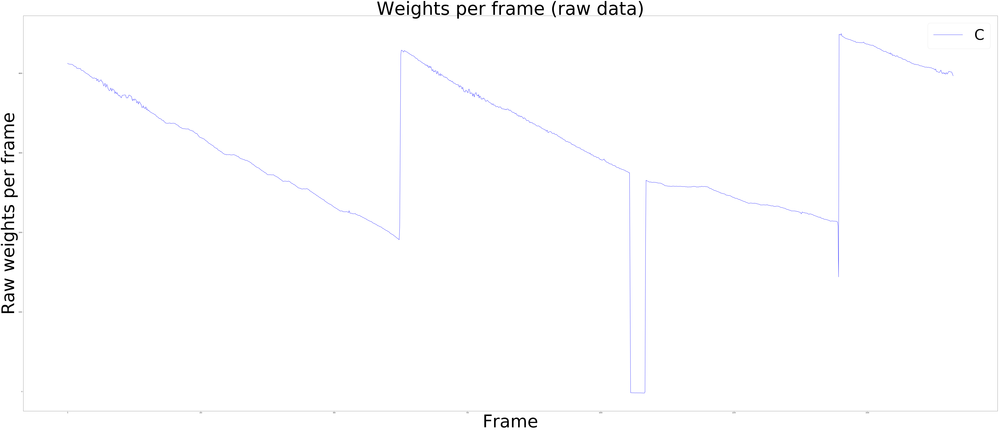

In [222]:
pylab.figure(figsize=(120,50))
pylab.plot(range(len(rawWeights)),rawWeights,'b')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Raw weights per frame', fontsize=120)
pylab.title('Weights per frame (raw data)', fontsize=124)
pylab.legend('Current weight coming from the scale', fontsize=100)
pylab.show()

The raw data shows that as the time is passing weight is going down. It is is going down until the bucket needs to be changed. That is why the graph is going down with the periodical step up. But there are also some human mistakes, like one step down as seen on the graph.

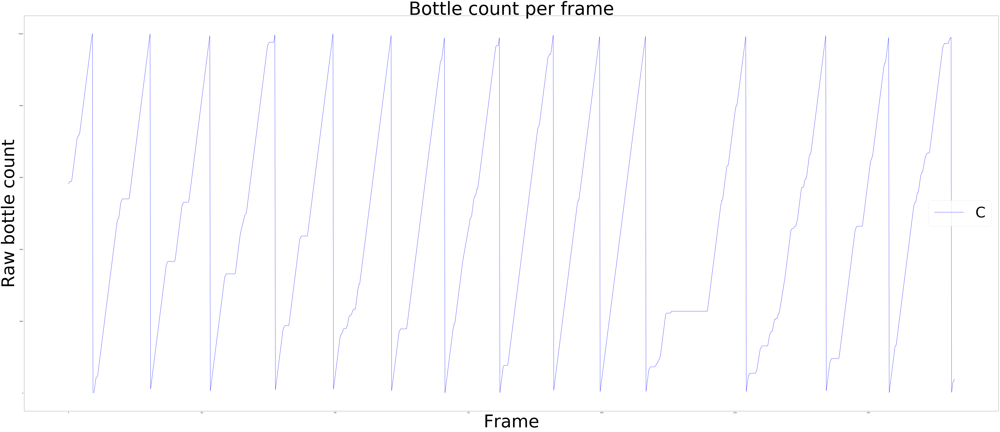

In [223]:
pylab.figure(figsize=(120,50))
pylab.plot(range(len(rawBtlCntr)),rawBtlCntr,'b')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Raw bottle count', fontsize=120)
pylab.title('Bottle count per frame', fontsize=124)
pylab.legend(('Current bottle count coming from the scale'), fontsize=100)
pylab.show()

In this graph we could see that the bottle counter is going from 0 - 10000. After it gets to the 10000 it resets to 0.

## Data preparation

Since we need the data that we could use to evaluate the weight consumption in one batch, we need to tranform them. First of all, we need to find consumption in each frame. We will get that info if we get the previous weight from the scale and calculate how much is the differance with the current weight. It is the same with bottles.

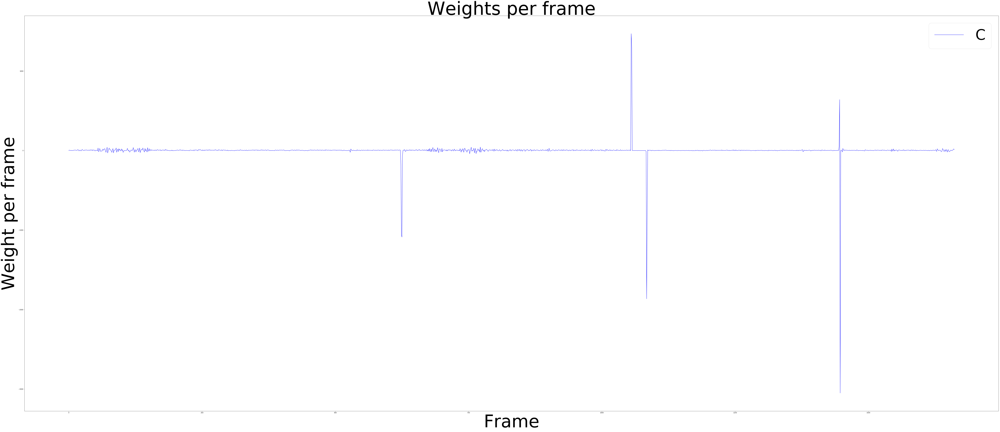

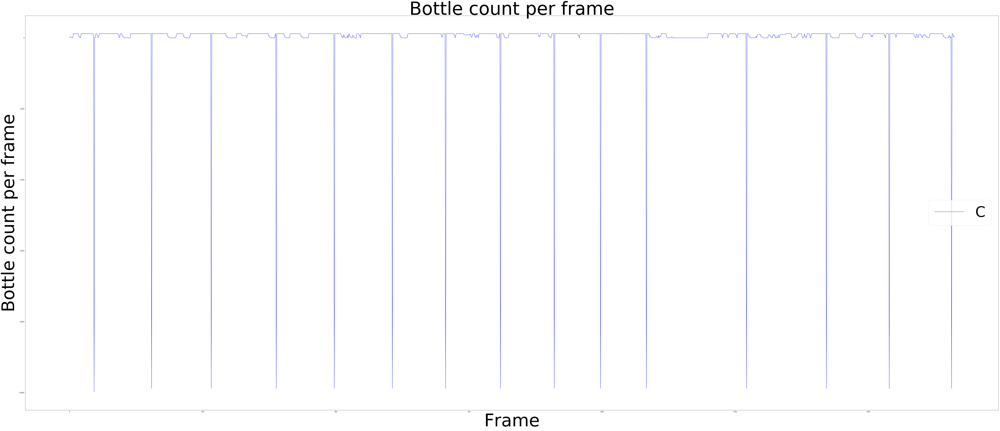

In [224]:
prev_weight = int(json_data[0]['LC1'])       
prev_btlcntr = int(json_data[0]['BTLCNTR2'])
weightdiffsraw = []
btldiffsraw = []
for j in json_data:
    if int(j['FrameType']) == 1:   #uzimamo samo vrednosti sa PLC-a
        #trenutne vrednosti koje dolaze sa PLC-a, odn. u ovom slučaju iz JSON-a
        curr_weight = int(j['LC1'])
        curr_btlcntr = int(j['BTLCNTR2'])
        
        #weights are goind down in each frame that is why we calculate consumption in frame like previous - current
        weight_diff = prev_weight - curr_weight 
        #bottle counter is goind up in each frame, so consamption in each frame is:
        btlcntr_diff = curr_btlcntr - prev_btlcntr
        
        #this is the list of the raw consumption per frame
        weightdiffsraw.append(weight_diff)
        
        btldiffsraw.append(btlcntr_diff)
        
        prev_weight = curr_weight
        prev_btlcntr = curr_btlcntr
        
pylab.figure(figsize=(120,50))
pylab.plot(range(len(weightdiffsraw)),weightdiffsraw,'b')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Weight per frame', fontsize=120)
pylab.title('Weights per frame', fontsize=124)
pylab.legend('Current weight differance', fontsize=100)
pylab.show()

pylab.figure(figsize=(120,50))
pylab.plot(range(len(btldiffsraw)),btldiffsraw,'b')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Bottle count per frame', fontsize=120)
pylab.title('Bottle count per frame', fontsize=124)
pylab.legend('Current bottle count differance', fontsize=100)
pylab.show()

From the graphs it is clear that we need to pay attention on the step up and down. Those steps are because the bucket is being changed or the bottle counter resets to 0. Now, we are going to change that.

In [225]:
prev_weight = int(json_data[0]['LC1'])       
prev_btlcntr = int(json_data[0]['BTLCNTR2'])
weightdiffsraw = []
btldiffsraw = []
corection = 10000

for j in json_data:
    if int(j['FrameType']) == 1:   #uzimamo samo vrednosti sa PLC-a
        #trenutne vrednosti koje dolaze sa PLC-a, odn. u ovom slučaju iz JSON-a
        curr_weight = int(j['LC1'])
        curr_btlcntr = int(j['BTLCNTR2'])
        
        if prev_btlcntr>9500 and curr_btlcntr<500:
            prev_btlcntr = prev_btlcntr - corection
        if abs(prev_weight - curr_weight)>100:
            prev_weight = curr_weight
        
        #weights are goind down in each frame that is why we calculate consumption in frame like previous - current
        weight_diff = prev_weight - curr_weight 
        #bottle counter is goind up in each frame, so consamption in each frame is:
        btlcntr_diff = curr_btlcntr - prev_btlcntr
        
        #this is the list of the raw consumption per frame
        weightdiffsraw.append(weight_diff)
        
        btldiffsraw.append(btlcntr_diff)
        
        prev_weight = curr_weight
        prev_btlcntr = curr_btlcntr
        


Lets plot the adhesive consumption in each frame

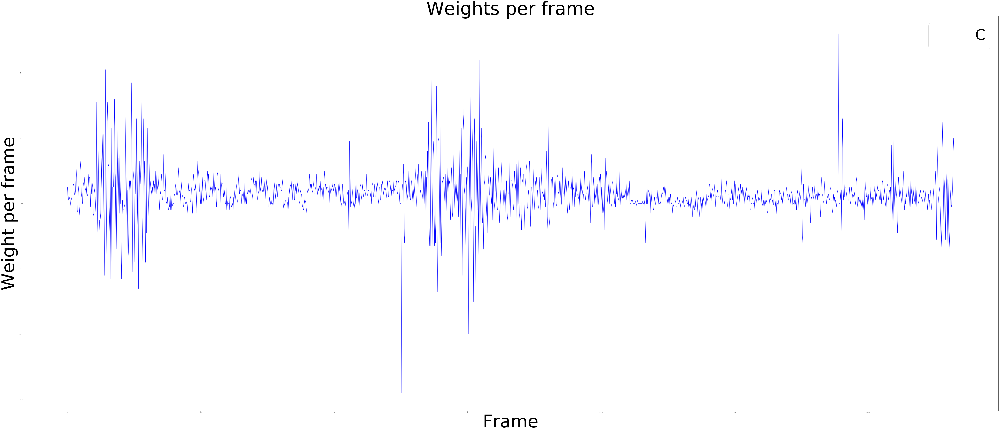

In [226]:
pylab.figure(figsize=(120,50))
pylab.plot(range(len(weightdiffsraw)),weightdiffsraw,'b')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Weight per frame', fontsize=120)
pylab.title('Weights per frame', fontsize=124)
pylab.legend('Current weight differance', fontsize=100)
pylab.show()

On this graph we could already see the noise comming from the sensor. But lets stop here for a moment. Here, we are not seeing only the noise from the sensor (scale), but there are some expected fluctuation. The actual adhesive consumption in each frame depends on the number of bottles in that frame. The number of bottle in the fareme is not a constant, teherfore it is expected that weights has some fluctuation in each frame. And we need to be awear that our weights per frame graph shoud not be perfectly smoot. The only thing we need to do here is to remove noise from this fluctuations.



Now lets plot the number of bottles in each frame.

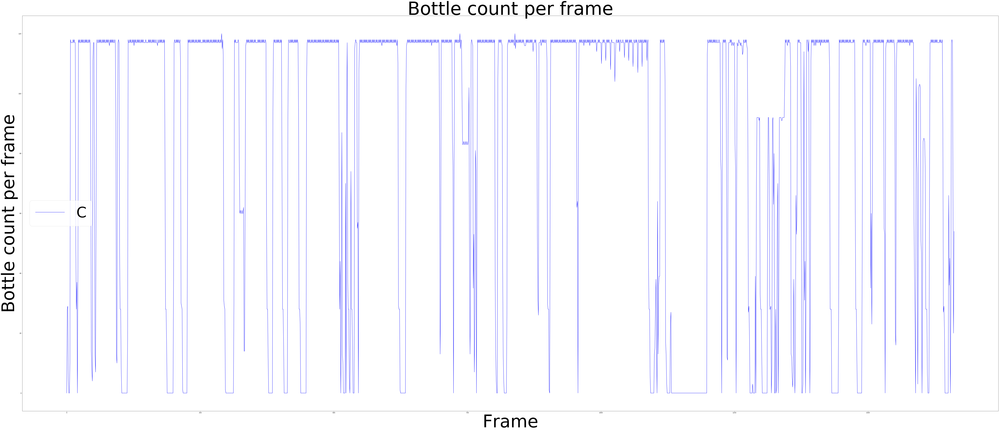

In [227]:
pylab.figure(figsize=(120,50))
pylab.plot(range(len(btldiffsraw)),btldiffsraw,'b')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Bottle count per frame', fontsize=120)
pylab.title('Bottle count per frame', fontsize=124)
pylab.legend('Current bottle count differance', fontsize=100)
pylab.show()

It should be clear after this that the number of bottles is realy different in each frame, so it is not strange that the adhesive consumption per frame should have some fluctuations.

## Linear regression

As explained, we need to remove noise from the fluctuations on the adhesive consumption per frame. Fluctuations per frame are expected because there is a different number of bottles in each frame. The more bottles passes, the more adhesive we spend, and wisewerse. But the noise in that fluctuation is obvious if we show adhesive consumption per bottle in each frame.



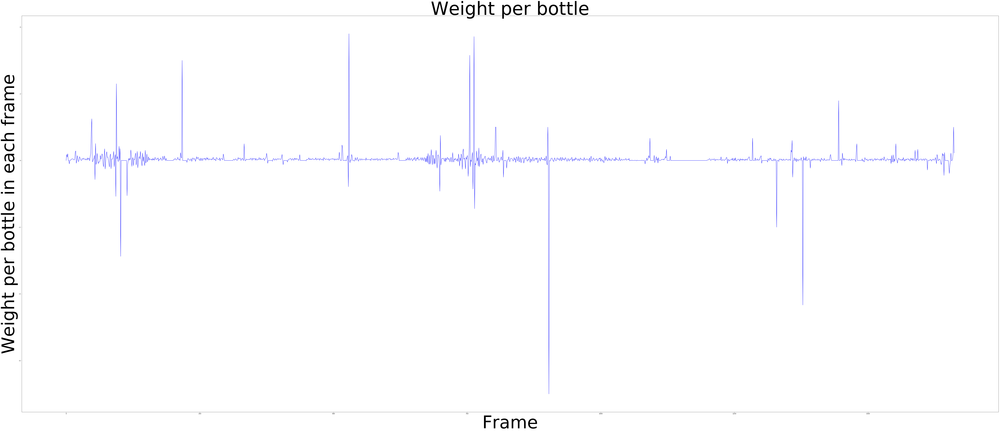

In [228]:
prev_weight = int(json_data[0]['LC1'])       
prev_btlcntr = int(json_data[0]['BTLCNTR2'])
weightdiffsraw = []
btldiffsraw = []
meanbefore = []
corection = 10000

for j in json_data:
    if int(j['FrameType']) == 1:   #uzimamo samo vrednosti sa PLC-a
        #trenutne vrednosti koje dolaze sa PLC-a, odn. u ovom slučaju iz JSON-a
        curr_weight = int(j['LC1'])
        curr_btlcntr = int(j['BTLCNTR2'])
        
        if prev_btlcntr>9500 and curr_btlcntr<500:
            prev_btlcntr = prev_btlcntr - corection
        if abs(prev_weight - curr_weight)>100:
            prev_weight = curr_weight
        
        #weights are goind down in each frame that is why we calculate consumption in frame like previous - current
        weight_diff = prev_weight - curr_weight 
        #bottle counter is goind up in each frame, so consamption in each frame is:
        btlcntr_diff = curr_btlcntr - prev_btlcntr
        
        #this is the list of the raw consumption per frame
        weightdiffsraw.append(weight_diff)
        
        btldiffsraw.append(btlcntr_diff)
        
        if btlcntr_diff != 0:
            lcpb = weight_diff/float(btlcntr_diff)
            meanbefore.append(lcpb)
        else:
            meanbefore.append(0.0)
        
        prev_weight = curr_weight
        prev_btlcntr = curr_btlcntr
        
pylab.figure(figsize=(120,50))
pylab.plot(range(len(meanbefore)),meanbefore,'b')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Weight per bottle in each frame', fontsize=120)
pylab.title('Weight per bottle', fontsize=124)
#pylab.legend('Current bottle count differance', fontsize=100)
pylab.show()

Now we need to see where are this noise coming from.
First of all, the noise occurs because on the bucket with the adhesive there is a vibrating motor. It pulls the adhesive from the bucket to the line. And this kind of noise is expected. There will be more words about dealing with this kind of noise in the Kalman filter part. Before using the Kalman filter we could prepare the data even more. 

As we could see on the graph weight per buttle in each frame, there are some peaks that we know from the physical process that are not normal and expected. So if we know that, why not cut them.
How can we do that?
Well the idea is to find the peacks and cut them, set the mean value for them. Also, we could do this also for the weight per frame values. We do know that expected value (weight) in the frame should be some mean consumption per bottle times number of bottles in that frame. So we could do this kind of cutting the peaks on two levels, consumption per frame and per bottle.

Why this part of the script is named Linear regression? Simply because here we are using that technic, but on the basic level.

Linear regression is an ML supervised learning algorithm. It used for finding and predicting the best linear function for the data set. The data set could have one or more dimensions. In our case, we have a very simple supervised learning problem. We want to substitute abnormal values on the graph, that we know are impossible, with expected values. We could build our model on the previous measurments. Based on that model, we could predict next step. In the case of weight per bottle, we expect constant value to be our model and on the weight per frame, we do expect that constant value times number of bottles. Model is simple mean of some previous values. We do know from expirience that we could build our model based on 21 previous measurements.

Now we can see how that code looks like.

In [229]:
prev_weight = int(json_data[0]['LC1'])       
prev_btlcntr = int(json_data[0]['BTLCNTR2'])
weightdiffsraw = []
btldiffsraw = []
weightdiffsaveraged = []
mean = []
mean21List = []
mean21 = 0.1
corection = 10000

for j in json_data:
    if int(j['FrameType']) == 1:   #uzimamo samo vrednosti sa PLC-a
        #trenutne vrednosti koje dolaze sa PLC-a, odn. u ovom slučaju iz JSON-a
        curr_weight = int(j['LC1'])
        curr_btlcntr = int(j['BTLCNTR2'])
        
        if prev_btlcntr>9500 and curr_btlcntr<500:
            prev_btlcntr = prev_btlcntr - corection
        if abs(prev_weight - curr_weight)>100:
            prev_weight = curr_weight
        
        #weights are goind down in each frame that is why we calculate consumption in frame like previous - current
        weight_diff = prev_weight - curr_weight 
        #bottle counter is goind up in each frame, so consamption in each frame is:
        btlcntr_diff = curr_btlcntr - prev_btlcntr
        
        #this is the list of the raw consumption per frame
        weightdiffsraw.append(weight_diff)
        
        btldiffsraw.append(btlcntr_diff)
        
        #15 is the value taken from the previous graph. If we have a peak greater than 15 then put it to be average
        #mean21 is the model form the supervised learning algorithm
        #it is being adopted on every step
        #in this step we are averaging the peacks in the weight per frame
        if abs(mean21*btlcntr_diff - weight_diff) > 15:
             weight_diff = mean21*btlcntr_diff
                
        weightdiffsaveraged.append(weight_diff)
        
        if btlcntr_diff != 0:
            lcpb = weight_diff/float(btlcntr_diff)
            if len(mean) > 0:
                #0.4 is the value taken from the previous graph. If we have a peak greater than 0.4 then put it to be average
                #in this step we are averaging the peacks in the weight per bottle
                if abs(lcpb) > 0.4:
                    lcpb = mean21
            mean.append(lcpb)
        else:
            mean.append(0.0)
            
        #now lets calculate mean21, a mean value for the previous 21 measurments
        mean21 = 0.0
        sum = 0.0
        n = 0
        br = 0
        if len(mean) > 21:
            n = len(mean) - 21
        for i in range(n, len(mean)):
            if mean[i] != 0:
                sum = sum + mean[i]
                br = br + 1
        if i > 0 and  br > 0:
            mean21 = sum/br
        else:
            mean21 = sum
            
        mean21List.append(mean21)
        
        prev_weight = curr_weight
        prev_btlcntr = curr_btlcntr

Lets plot the adhesive consumption before and after the mean21 calculation.

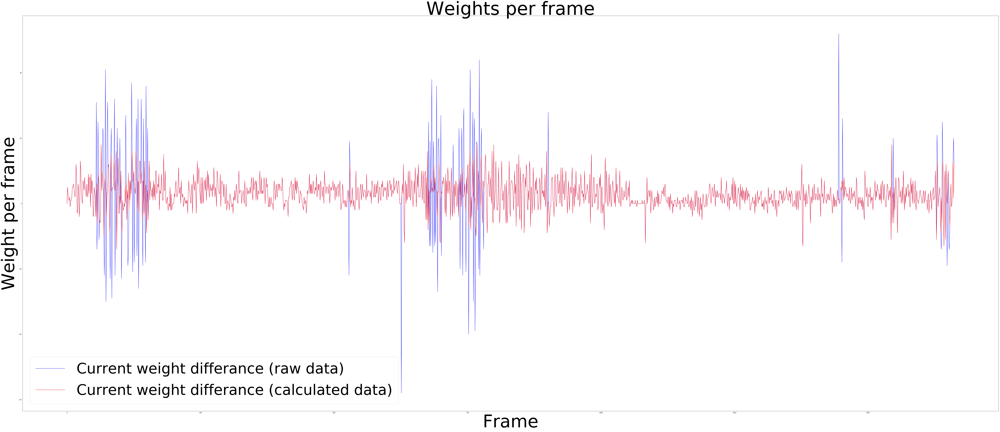

In [230]:
pylab.figure(figsize=(120,50))
pylab.plot(range(len(weightdiffsraw)),weightdiffsraw,'b',range(len(weightdiffsaveraged)),weightdiffsaveraged,'r')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Weight per frame', fontsize=120)
pylab.title('Weights per frame', fontsize=124)
pylab.legend(('Current weight differance (raw data)','Current weight differance (calculated data)'), fontsize=100)
pylab.show()

It could be seen that there are some differences but only when the blue graph (raw data) is going beyond the normal value.

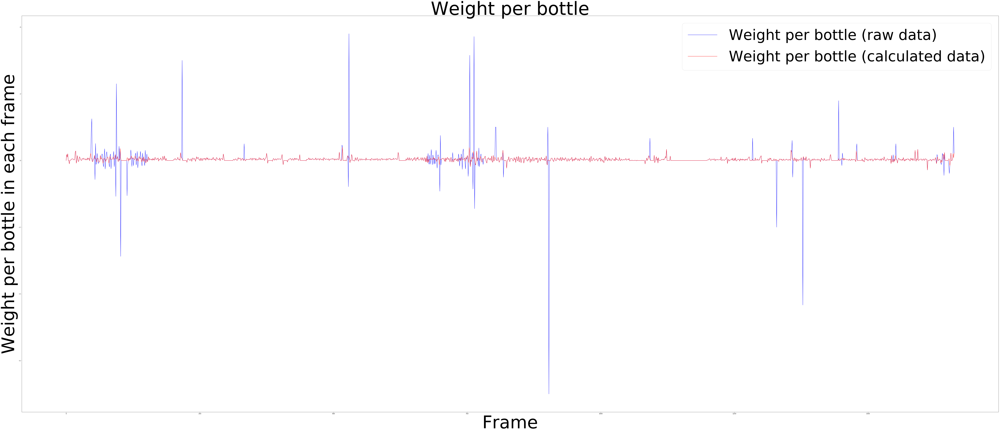

In [231]:
pylab.figure(figsize=(120,50))
pylab.plot(range(len(meanbefore)),meanbefore,'b',range(len(mean)),mean,'r')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Weight per bottle in each frame', fontsize=120)
pylab.title('Weight per bottle', fontsize=124)
pylab.legend(('Weight per bottle (raw data)','Weight per bottle (calculated data)'), fontsize=100)
pylab.show()

## Kalman filter

The mean21 filter, or Linear regression as called previuosly, fixed the results quite a lot. But there is still a way to make the results even more close to the real state. Kalman filter could do that.
Kalman filter falls into the unsupervised learning algorithm. That means that there is no need for history in order to make a prediction of the next state. But, previous sentence is not quite true, because, the history is contained in the weights factor of the algorithm. Those weights are updated on every new measurement and they bring graph close to the real state. But lets start from the begining.
Kalman filter could be used if we know that states are changing linearly. So if we presume that there is going to be linear change from one state to another, first requirement for the usage of Kalman filter is achieved. There is a way to overcome this requirement so that Kalman filter could be used for the non linear change, but that is not the scope of this script. The second requirement is about the error. If you are using GPS, accelerometer or as in our case scale, there is some error in the measurement. In all of this cases error has Gaussian distribution. 

Lets try to explain this on some simple example. Suppose that we have putted GPS sensor at one place and we leaved it there for 24h. If we take a GPS value every 10s in that 24h, we will have 864 values that deviate from the real value. That is because there is an error in the measurement. But now if we take a look at how the values are distributet we will see that the most of them are near real value. 

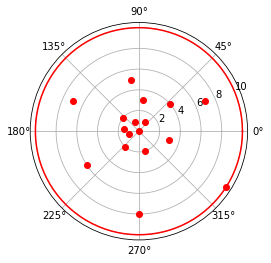

In [232]:
fig = plt.figure()
ax = fig.add_subplot(111, polar=True)
ax.plot(np.linspace(0, 2*np.pi, 100), np.ones(100)*10, color='r', linestyle='-')
plt.plot([0,1,1,1.5,2,2,3,4,5,7,6,8,10,7,3,2,1], 'ro')
plt.show()

The center of the circle is the real value, and few dots represent an example of how the values are distributet near the real value. Now, if calculate a number of dots in each concentric cirkle, we will get noraml or Gaussian distribution.

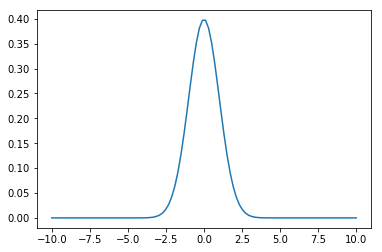

In [233]:
mu = 0
variance = 1
sigma = math.sqrt(variance)
x = np.linspace(-10, 10, 100)
plt.plot(x,mlab.normpdf(x, mu, sigma))

plt.show()

Where the most of the dots are positioned in the nearest circle to the real value. Hopefully, this explains normal distribution.

Now, in our case, we can not leave scale to be in one state for 24h. If we leaved it, the distribution around the real value would be similar to the example above. But, we know that the distribution will be like that, so based on that knowladge we could do something.

So, there are two requirements that needs to be fullfiled if we want to use Kalman filter:
1. Lienar change of state
2. Gaussian (normal) distribution

Both of them are in our case fullfiled.

So, what is the Kalman filter?

Kalman filter 'knows' that the distribution is normal and the movement is linear so it predicts next state based on these presumtions and the previous step. How? First, in our algorithm, we need to 'say' to the Kalman filter what is the model of the movement (movement in a sense of how the linear function looks like). If we are measuring the real physical movement using the accelerometer, in the model for the next state we need to include basic kinematic formulas. 
In our case, what will be the movement model?
If we are going on the level of weights in every frame, that means that our value depends on the number of bottles in that particular frame that we try to predict. But also, we need consumption per bottle taken in previous state. Now, we know that because of the error our consumption per bottle varies in every frame. But, we have done something that we called supervised learning, Linear regresion or simply mean value of the consumption per bottle for the previous 21 measures. We have called that value mean21 for every frame and we putted those values in the list we called mean21List. Our movement formula or model of state change based on previous step is equals to averaged adhesive consumption per bottle taken in previous step times number of bottles in this frame

Wpredicted = mean21List[z-1]*btldiffsraw[z]
Wpredicted - supposed or presumed value based on the previous knowledge

Kalman filter first of all predicts next step based on the previous step and transition model. Then predicts error based also on previous steps. The prediction phase is finished. Next phase is to update states.
Update means first to calculate how much predicted value deviate from the value taken from the sensor (y). Then based on that knowledge update the weights (Kalaman gain - kg). This Kalman gain will give us the information of how much we trust sensor and how much we need to 'move' our predicted value to the value coming from the sensor. That is how we get Wk - updated predicted value.

This is the simpliest case of the Kalman filter because we only have one variable and we are therefore using one dimensional matrix.



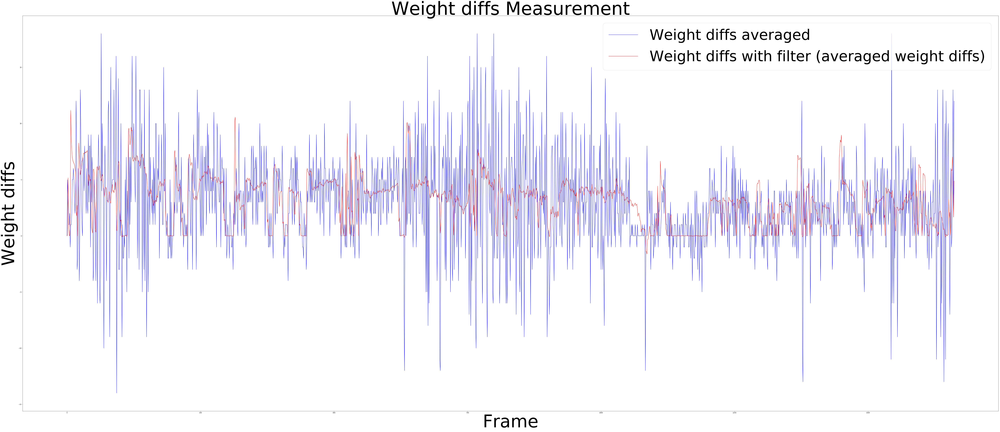

In [234]:
#Initial state
Wprev = float(weightdiffsaveraged[0])
BTLcumprev = 1
Pkprev = 1.0
Hprev = 1
q = 0.001

weights = []
conperbottle = []

for z in range (0, len(weightdiffsaveraged)):

    #prediction
    a = 1
    if(z>0):
        a = mean21List[z-1]

    #LCpredicted = float(a*LCprev)               #x[k] = a*x[k-1] + Buk
    
    #ukoliko je a=mean21List[z]
    Wpredicted = float(a*btldiffsraw[z])           #x[k] = a*x[k-1] + Buk
    Pk = a*Pkprev*a + q                          #p[k] = a * p[k - 1] * a + q

    #update 
    y = float(weightdiffsaveraged[z]) - Hprev*Wpredicted   #y = z - h * x[k]
    kg = Pk*Hprev/(Hprev*Pk*Hprev + 0.1)        #kg = p * h / (h * p * h + r)
    Wk = Wpredicted + kg*y                    #x[k] = x[k] + kg * y
    Pk = (1 - Hprev*kg)*Pk                      #p[k] = (1 - kg * h) * p[k]

    
    Wprev = Wk
    Pkprev = Pk
        
    weights.append(Wk)
    if(btldiffsraw[z] != 0):
        conperbottle.append(Wk/btldiffsraw[z])
    else:
        conperbottle.append(0.0)
    
pylab.figure(figsize=(120,50))
pylab.plot(range(len(weightdiffsaveraged)),weightdiffsaveraged,'b',range(len(weights)),weights,'r')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Weight diffs', fontsize=120)
pylab.title('Weight diffs Measurement', fontsize=124)
pylab.legend(('Weight diffs averaged','Weight diffs with filter (averaged weight diffs)'), fontsize=100)
#naredna linija koda je zakomentarisana ali ako se otkomentariše, može se kontrolisati prikaz na x i y osi
#pylab.axis([0,1000,-60,90])              #pylab.axis([x,x1,-y,y1])
pylab.show()

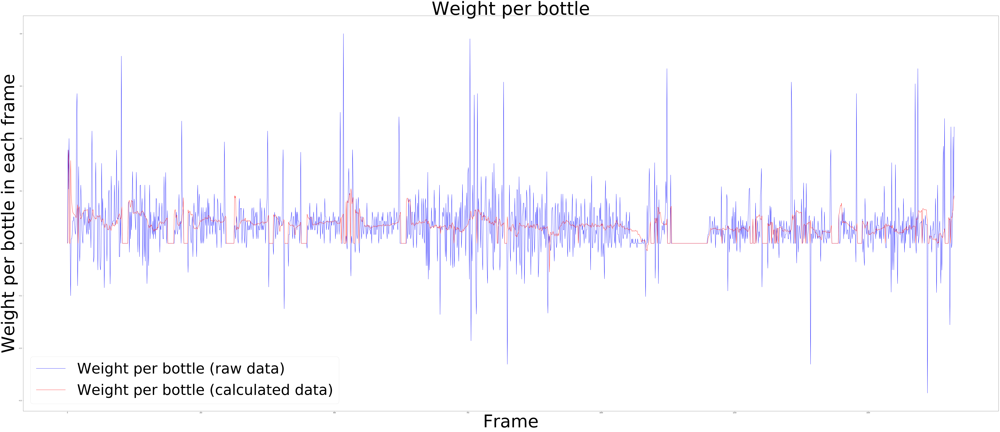

In [235]:
pylab.figure(figsize=(120,50))
pylab.plot(range(len(mean)),mean,'b',range(len(conperbottle)),conperbottle,'r')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Weight per bottle in each frame', fontsize=120)
pylab.title('Weight per bottle', fontsize=124)
pylab.legend(('Weight per bottle (raw data)','Weight per bottle (calculated data)'), fontsize=100)
pylab.show()

It is important to say that we are here completely bound to the physical system and process. But there is also a way of using the Kalman filter by not getting into the details of the system and without knowing the state change model. Then, the current predicted value depends only on the previous and the state is updated from the sensor values.

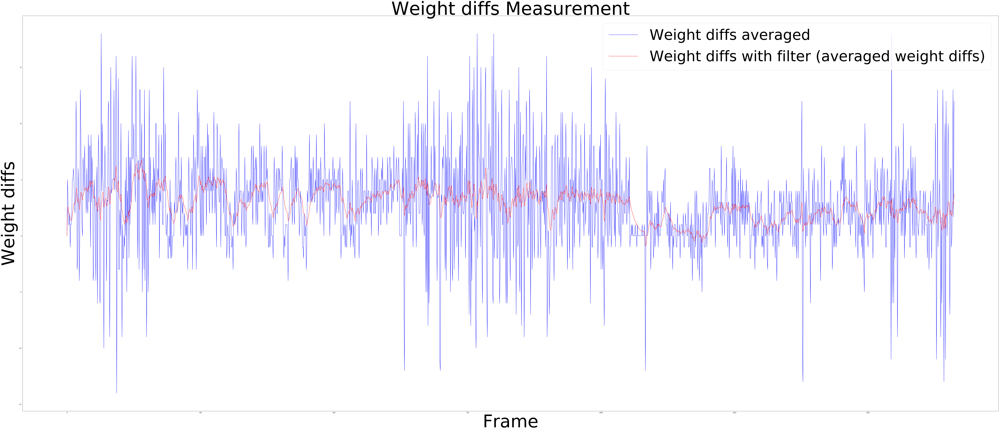

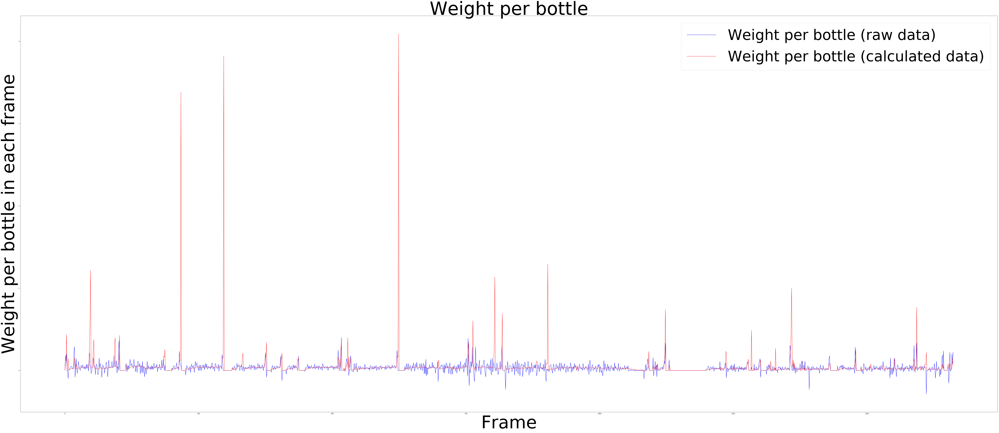

In [236]:
#Initial state
Wprev = float(weightdiffsaveraged[0])
BTLcumprev = 1
Pkprev = 1.0
Hprev = 1
q = 0.001

weights = []
conperbottle = []

for z in range (0, len(weightdiffsaveraged)):

    #prediction
    a = 1

    Wpredicted = float(a*Wprev)               #x[k] = a*x[k-1] + Buk
    Pk = a*Pkprev*a + q                          #p[k] = a * p[k - 1] * a + q

    #update 
    y = float(weightdiffsaveraged[z]) - Hprev*Wpredicted   #y = z - h * x[k]
    kg = Pk*Hprev/(Hprev*Pk*Hprev + 0.1)        #kg = p * h / (h * p * h + r)
    Wk = Wpredicted + kg*y                    #x[k] = x[k] + kg * y
    Pk = (1 - Hprev*kg)*Pk                      #p[k] = (1 - kg * h) * p[k]

    
    Wprev = Wk
    Pkprev = Pk
        
    weights.append(Wk)
    if(btldiffsraw[z] != 0):
        conperbottle.append(Wk/btldiffsraw[z])
    else:
        conperbottle.append(0.0)
    
pylab.figure(figsize=(120,50))
pylab.plot(range(len(weightdiffsaveraged)),weightdiffsaveraged,'b',range(len(weights)),weights,'r')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Weight diffs', fontsize=120)
pylab.title('Weight diffs Measurement', fontsize=124)
pylab.legend(('Weight diffs averaged','Weight diffs with filter (averaged weight diffs)'), fontsize=100)
#naredna linija koda je zakomentarisana ali ako se otkomentariše, može se kontrolisati prikaz na x i y osi
#pylab.axis([0,1000,-60,90])              #pylab.axis([x,x1,-y,y1])
pylab.show()

pylab.figure(figsize=(120,50))
pylab.plot(range(len(mean)),mean,'b',range(len(conperbottle)),conperbottle,'r')
pylab.xlabel('Frame', fontsize=120)
pylab.ylabel('Weight per bottle in each frame', fontsize=120)
pylab.title('Weight per bottle', fontsize=124)
pylab.legend(('Weight per bottle (raw data)','Weight per bottle (calculated data)'), fontsize=100)
pylab.show()

Here we can see that when the transition model does not depends on the physical system we have some peaks. Now all those peack could be handled. But we are not going to do that at this moment because we would like to stay connected with the physical system.